# Introduction: Random Forest in Python

In this notebook, we will implement a random forest in Python. We'll start with a single decision tree and a simple problem, and then work our way to a random forest and a real-world problem.

In [1]:
import numpy as np
import pandas as pd

RSEED = 50

# Start Simple: Single Decision Tree

In [2]:
X = np.array([[2, 2], 
              [2, 1],
              [2, 3], 
              [1, 2], 
              [1, 1],
              [3, 3]])

y = np.array([0, 1, 1, 1, 0, 1])

This is a linearly inseparable problem. A simple linear classifier will not be able to draw a boundary! 

Text(0.5,1,'Data')

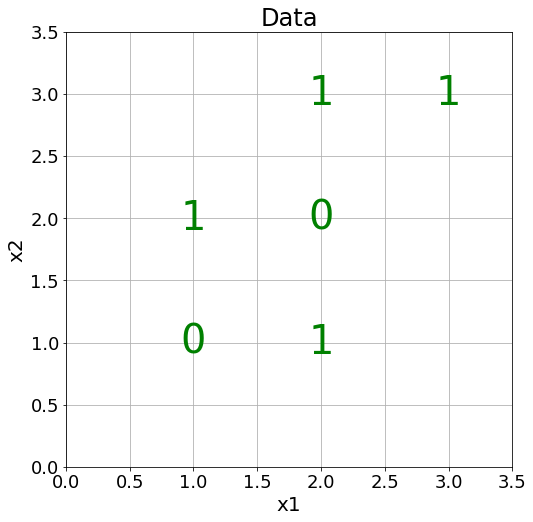

In [3]:
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

plt.style.use('seaborn-dark-palette')
plt.rcParams['font.size'] = 18
plt.figure(figsize = (8, 8))

# Plot each point as the label
for x1, x2, label in zip(X[:, 0], X[:, 1], y):
    plt.text(x1, x2, str(label), fontsize = 40, color = 'g',
             ha='center', va='center')
    
# Plot formatting
plt.grid(None);
plt.xlim((0, 3.5));
plt.ylim((0, 3.5));
plt.xlabel('x1', size = 20); plt.ylabel('x2', size = 20); plt.title('Data', size = 24)

In [4]:
from sklearn.tree import DecisionTreeClassifier

tree = DecisionTreeClassifier(random_state=RSEED)
tree.fit(X, y)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=50,
            splitter='best')

In [5]:
print(f'Model Accuracy: {tree.score(X, y)}')

Model Accuracy: 1.0


## Visualize Decision Tree

To get a sense of how the decision tree "thinks", we can show it using a utility. This will show each node in the tree which we can use to make new predictions.

In [6]:
from sklearn.tree import export_graphviz

export_graphviz(tree, 'tree.dot', rounded = True, 
                feature_names = ['x1', 'x2'], 
                class_names = ['0', '1'], filled = True)

In [7]:
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=400']);

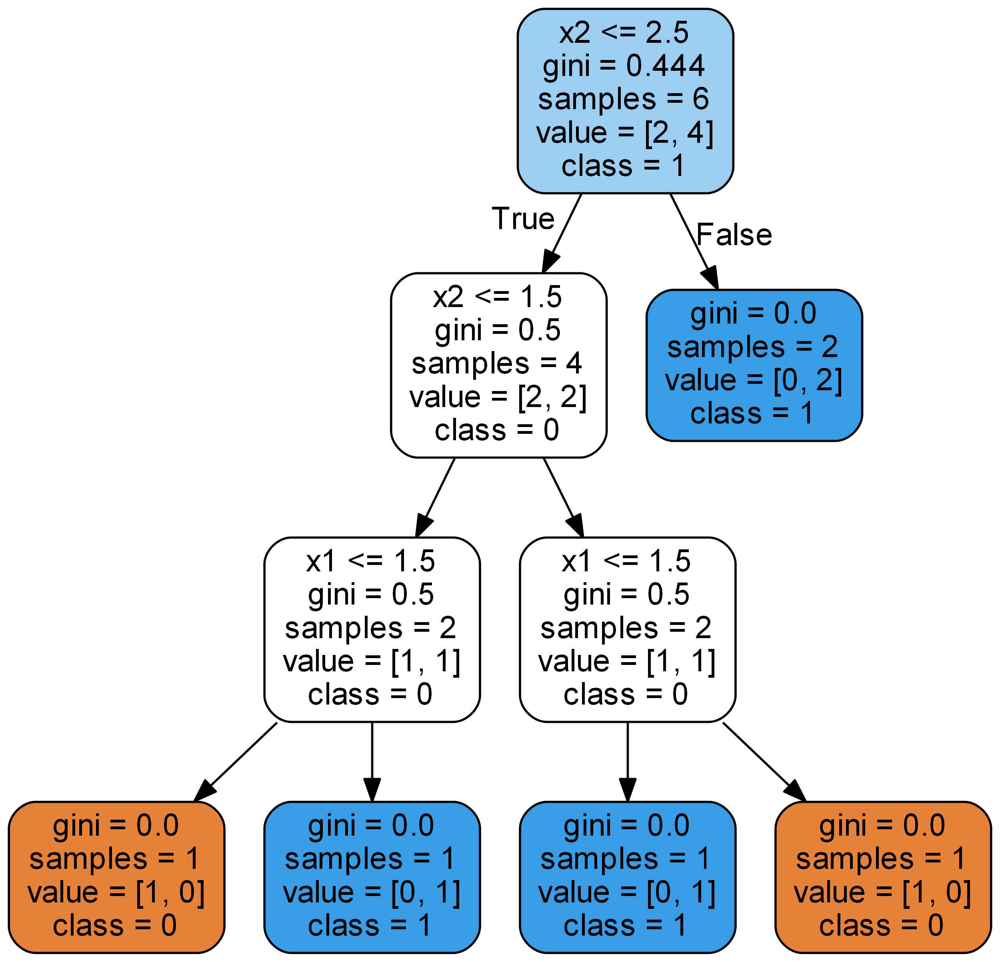

In [8]:
from IPython.display import Image
Image('tree.png')

# Make Predictions on new points

Now we add three more points to the graph and see where the random forest places them. In fact, we can make the classifications ourselves using the above tree.

In [9]:
X_test = np.array([[0.5, 1.5],
                   [3, 2.6],
                   [1.5, 1.5],
                   [3, 0.9]])

If we use the decision tree, we arrive at 0 (bottom far left node), 1 (top right node), 0 (bottom far left node), and 1 (bottom second from left node). Let's test out this reasoning.

In [10]:
y_test_guess = np.array([0, 1, 0, 1])

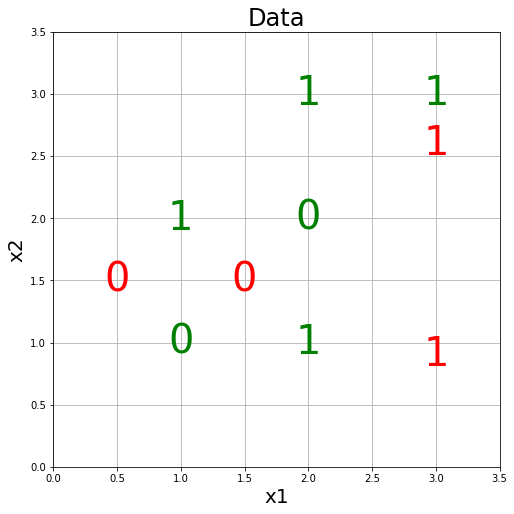

In [11]:
plt.figure(figsize = (8, 8))

# Original data
for x1, x2, label in zip(X[:, 0], X[:, 1], y):
    plt.text(x1, x2, str(label), fontsize = 40, color = 'g',
                 ha='center', va='center')
# New points
for x1, x2, label in zip(X_test[:, 0], X_test[:, 1], y_test_guess):
    plt.text(x1, x2, str(label), fontsize = 40, color = 'r',
                 ha='center', va='center')
    
plt.grid(None);
plt.xlim((0, 3.5));
plt.ylim((0, 3.5));
plt.xlabel('x1', size = 20); plt.ylabel('x2', size = 20); plt.title('Data', size = 24);

In [12]:
tree.predict(X_test)

array([0, 1, 0, 1])

It looks like we correctly parsed the tree. We can also print out the decision path for each prediction, which shows the nine nodes in the tree, and whether or not the given observation passed through the node (by 0 or 1).

In [13]:
path1 = tree.decision_path(X_test[0, :].reshape(1, -1))
path2 = tree.decision_path(X_test[1, :].reshape(1, -1))

In [14]:
path1.toarray()

array([[1, 1, 1, 1, 0, 0, 0, 0, 0]], dtype=int64)

This path shows the tree went left, left, left, left.

In [15]:
path2.toarray()

array([[1, 0, 0, 0, 0, 0, 0, 0, 1]], dtype=int64)

This path shows the tree went right and then stayed there.

# Move on to Real Dataset

The following data set is from the Costa Rica Household Poverty prediction challenge, a machine learning competition on Kaggle where the objective is to predict the poverty of a household. This data has already been formatted and cleaned.

In [16]:
df = pd.read_csv('data/train_selected_clean.csv')

In [17]:
df['label'].value_counts()

1    2309
0     664
Name: label, dtype: int64

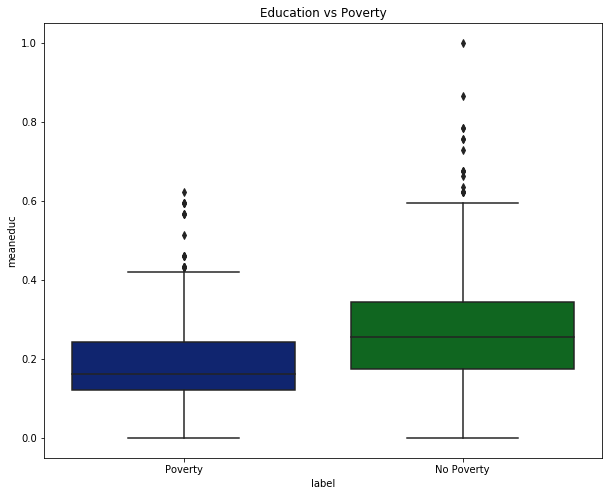

In [18]:
plt.figure(figsize = (10, 8))
sns.boxplot(x = 'label', y = 'meaneduc', data= df);
plt.title('Education vs Poverty');
plt.xticks([0,1], ['Poverty', 'No Poverty']);

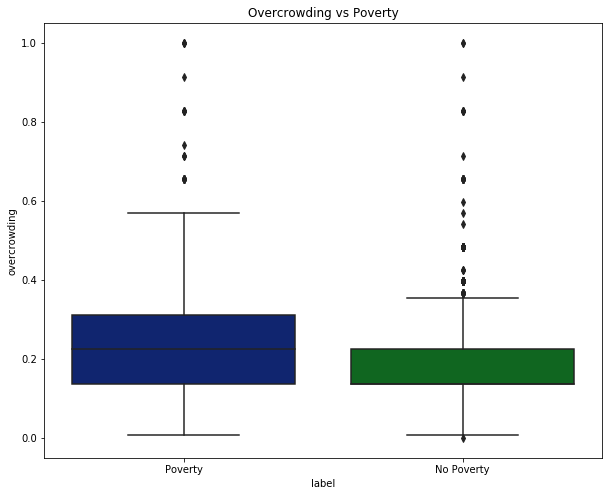

In [19]:
plt.figure(figsize = (10, 8))
sns.boxplot(x = 'label', y = 'overcrowding', data = df)
plt.title('Overcrowding vs Poverty');
plt.xticks([0,1], ['Poverty', 'No Poverty']);

## Split Data into Training and Validation Set

In [20]:
from sklearn.model_selection import train_test_split

# 500 examples in validation data
train, valid, train_labels, valid_labels = train_test_split(df.drop(columns = ['label']), 
                                                            np.array(df['label']),
                                                            test_size = 500, random_state = RSEED)

First, we'll train the decision tree on the data.

In [21]:
# Train tree
tree.fit(train, train_labels)

DecisionTreeClassifier(class_weight=None, criterion='gini', max_depth=None,
            max_features=None, max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, presort=False, random_state=50,
            splitter='best')

In [22]:
print(f'Train Accuracy: {tree.score(train, train_labels)}')
print(f'Valid Accuracy: {tree.score(valid, valid_labels)}')

Train Accuracy: 1.0
Valid Accuracy: 0.692


Clearly our tree has overfit to the training data! 

### Visualize Full Tree

As before, we can look at the full decision tree on the data.

In [23]:
# Save tree as dot file
export_graphviz(tree, 'tree_real_data.dot', rounded = True, 
                feature_names = train.columns, 
                class_names = ['poverty', 'no poverty'], filled = True)

# Convert to png
call(['dot', '-Tpng', 'tree_real_data.dot', '-o', 'tree_real_data.png', '-Gdpi=400'])

# Visualize
Image(filename='tree_real_data.png')

# Random Forest 

Now we can move on to a more powerful model, the random forest. This takes the idea of a single decision tree, and creates a model out of many of them to reduce the bias between trees.

In [24]:
from sklearn.ensemble import RandomForestClassifier

# Create the model with 100 trees
model = RandomForestClassifier(n_estimators=100, random_state=RSEED, n_jobs=-1)

# Fit on training data
model.fit(train, train_labels)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=100, n_jobs=-1,
            oob_score=False, random_state=50, verbose=0, warm_start=False)

In [25]:
print(f'Train Accuracy: {model.score(train, train_labels)}')
print(f'Valid Accuracy: {model.score(valid, valid_labels)}')

Train Accuracy: 1.0
Valid Accuracy: 0.786


The random forest has also overfit to the training data, but can better generalize to the testing data. 

In order to make sure our models are doing better than chance, we need to compare to a baseline estimate: guessing the most common label in the training data for all testing observations.

In [26]:
print(f'Baseline Valid Accuracy: {np.mean(valid_labels == 1)}')

Baseline Valid Accuracy: 0.778


In [27]:
from sklearn.metrics import roc_auc_score

In [28]:
roc_auc_score(valid_labels, tree.predict_proba(valid)[:, 1])

0.56061974570972

In [29]:
roc_auc_score(valid_labels, model.predict_proba(valid)[:, 1])

0.7730841381226984

# Random Forest Optimization through Random Search

In [30]:
from sklearn.model_selection import RandomizedSearchCV

# Hyperparameter grid
param_grid = {
    'n_estimators': np.linspace(10, 1000).astype(int),
    'max_depth': [None] + list(np.linspace(3, 20).astype(int)),
    'max_features': ['auto', 'sqrt', None] + list(np.arange(0.5, 1, 0.02)),
    'max_leaf_nodes': [None] + list(np.linspace(10, 50, 500).astype(int)),
    'min_samples_split': [2, 5, 10],
    'bootstrap': [True, False]
}

# Estimator for use in random search
estimator = RandomForestClassifier(n_jobs=-1, random_state = RSEED)

# Create the random search model
rs = RandomizedSearchCV(estimator, param_grid, n_jobs = -1, 
                        scoring = 'roc_auc', cv = 3, 
                        n_iter = 50, verbose = 1, random_state=RSEED)

# Fit 
rs.fit(train, train_labels)

Fitting 3 folds for each of 50 candidates, totalling 150 fits


[Parallel(n_jobs=-1)]: Done  34 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 150 out of 150 | elapsed:  4.5min finished


RandomizedSearchCV(cv=3, error_score='raise',
          estimator=RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=None, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
            oob_score=False, random_state=50, verbose=0, warm_start=False),
          fit_params=None, iid=True, n_iter=50, n_jobs=-1,
          param_distributions={'n_estimators': array([  10,   30,   50,   70,   90,  111,  131,  151,  171,  191,  212,
        232,  252,  272,  292,  313,  333,  353,  373,  393,  414,  434,
        454,  474,  494,  515,  535,  555,  575,  595,  616,  636,  656,
        676,  696,  717,  737,  757,  777,  ...9, 49, 49, 49, 49, 49, 49, 49, 49, 50], 'min_samples_split': [2, 5, 10], 'bootstrap': [True, False]},
          pre_dispatch='2*n_jobs', random_state=Non

In [31]:
rs.best_params_

{'bootstrap': False,
 'max_depth': 10,
 'max_features': 'auto',
 'max_leaf_nodes': 25,
 'min_samples_split': 10,
 'n_estimators': 1000}

In [32]:
best_model = rs.best_estimator_

In [33]:
print(f'Train Accuracy: {best_model.score(train, train_labels)}')
print(f'Validation Accuracy: {best_model.score(valid, valid_labels)}')

Train Accuracy: 0.8548321876263647
Validation Accuracy: 0.792


In [34]:
roc_auc_score(valid_labels, best_model.predict_proba(valid)[:, 1])

0.7724819935616851

In [35]:
estimator = best_model.estimators_[1]

# Export a tree from the forest
export_graphviz(estimator, 'tree_from_forest.dot', rounded = True, 
                feature_names=train.columns,
                class_names = ['poverty', 'no poverty'], filled = True)

In [36]:
call(['dot', '-Tpng', 'tree_from_forest.dot', '-o', 'tree_from_forest.png', '-Gdpi=400'])
Image('tree_from_forest.png')

# Conclusions

In this notebook, we saw both a single decision tree and a random forest. We demonstrated how a single decision tree severely overfits to the training data because it can get arbitrarily deep, but an entire random forest has much reduced variance. 